In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow_docs.vis import embed 
import numpy as np
import cv2
import os
import keras
import pandas as pd
import keras_tuner as kt
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from keras_tuner.tuners import RandomSearch
from sklearn.preprocessing import LabelEncoder


# Matplotlib 
from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib.patches as patches

# Animation libraries 
import imageio
from IPython.display import HTML, display

import os
import numpy as np
from PIL import Image
from glob import glob
from PIL import Image


from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Activation, Flatten, Conv2D, MaxPooling2D, LSTM
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras.applications import EfficientNetB0

# Kaggle Dataset
import opendatasets as od

### Get File Paths for the training and test sets


In [30]:
# File Paths

# Test Set File Path
testAcne = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Acne")
testKeratosis = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Actinic_Keratosis")
testBeniginTumors = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Benigin_tumors")
testBullous = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Bullous")
testCandidiasis = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Candidiasis")
testDrugEruption = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "DrugEruption")
testEczema = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Eczema")
testInfestations_Bites = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Infestations_Bites")
testLichen = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Lichen")
testLupus = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Lupus")
testMoles = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Moles")
testPsoriasis = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Psoriasis")
testRosacea = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Rosacea")
testSeborrh_Keratoses = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Seborrh_Keratoses")
testSkinCancer = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "SkinCancer")
testSun_Sunlight_Damage = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Sun_Sunlight_Damage")
testTinea = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Tinea")
testUnknown_Normal = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Unknown_Normal")
testVascular_Tumors = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Vascular_Tumors")
testVasculitis = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Vasculitis")
testVitiligo = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Vitiligo")
testWarts = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "test", "Warts")

# Train Set File Path 

trainAcne = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Acne")
trainKeratosis = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Actinic_Keratosis")
trainBeniginTumors = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Benigin_tumors")
trainBullous = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Bullous")
trainCandidiasis = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Candidiasis")
trainDrugEruption = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "DrugEruption")
trainEczema = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Eczema")
trainInfestations_Bites = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Infestations_Bites")
trainLichen = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Lichen")
trainLupus = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Lupus")
trainMoles = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Moles")
trainPsoriasis = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Psoriasis")
trainRosacea = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Rosacea")
trainSeborrh_Keratoses = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Seborrh_Keratoses")
trainSkinCancer = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "SkinCancer")
trainSun_Sunlight_Damage = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Sun_Sunlight_Damage")
trainTinea = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Tinea")
trainUnknown_Normal = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Unknown_Normal")
trainVascular_Tumors = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Vascular_Tumors")
trainVasculitis = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Vasculitis")
trainVitiligo = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Vitiligo")
trainWarts = os.path.join(os.path.dirname(os.getcwd()), "Datasets", "SkinDisease", "train", "Warts")





### Load Image Paths

In [31]:
# Test Set Image Lists
testAcneImages = glob(os.path.join(testAcne, '*.jpeg'))
testKeratosisImages = glob(os.path.join(testKeratosis, '*.jpeg'))
testBeniginTumorsImages = glob(os.path.join(testBeniginTumors, '*.jpeg'))
testBullousImages = glob(os.path.join(testBullous, '*.jpeg'))
testCandidiasisImages = glob(os.path.join(testCandidiasis, '*.jpeg'))
testDrugEruptionImages = glob(os.path.join(testDrugEruption, '*.jpeg'))
testEczemaImages = glob(os.path.join(testEczema, '*.jpeg'))
testInfestations_BitesImages = glob(os.path.join(testInfestations_Bites, '*.jpeg'))
testLichenImages = glob(os.path.join(testLichen, '*.jpeg'))
testLupusImages = glob(os.path.join(testLupus, '*.jpeg'))
testMolesImages = glob(os.path.join(testMoles, '*.jpeg'))
testPsoriasisImages = glob(os.path.join(testPsoriasis, '*.jpeg'))
testRosaceaImages = glob(os.path.join(testRosacea, '*.jpeg'))
testSeborrh_KeratosesImages = glob(os.path.join(testSeborrh_Keratoses, '*.jpeg'))
testSkinCancerImages = glob(os.path.join(testSkinCancer, '*.jpeg'))
testSun_Sunlight_DamageImages = glob(os.path.join(testSun_Sunlight_Damage, '*.jpeg'))
testTineaImages = glob(os.path.join(testTinea, '*.jpeg'))
testUnknown_NormalImages = glob(os.path.join(testUnknown_Normal, '*.jpeg'))
testVascular_TumorsImages = glob(os.path.join(testVascular_Tumors, '*.jpeg'))
testVasculitisImages = glob(os.path.join(testVasculitis, '*.jpeg'))
testVitiligoImages = glob(os.path.join(testVitiligo, '*.jpeg'))
testWartsImages = glob(os.path.join(testWarts, '*.jpeg'))

# Train Set Image Lists
trainAcneImages = glob(os.path.join(trainAcne, '*.jpeg'))
trainKeratosisImages = glob(os.path.join(trainKeratosis, '*.jpeg'))
trainBeniginTumorsImages = glob(os.path.join(trainBeniginTumors, '*.jpeg'))
trainBullousImages = glob(os.path.join(trainBullous, '*.jpeg'))
trainCandidiasisImages = glob(os.path.join(trainCandidiasis, '*.jpeg'))
trainDrugEruptionImages = glob(os.path.join(trainDrugEruption, '*.jpeg'))
trainEczemaImages = glob(os.path.join(trainEczema, '*.jpeg'))
trainInfestations_BitesImages = glob(os.path.join(trainInfestations_Bites, '*.jpeg'))
trainLichenImages = glob(os.path.join(trainLichen, '*.jpeg'))
trainLupusImages = glob(os.path.join(trainLupus, '*.jpeg'))
trainMolesImages = glob(os.path.join(trainMoles, '*.jpeg'))
trainPsoriasisImages = glob(os.path.join(trainPsoriasis, '*.jpeg'))
trainRosaceaImages = glob(os.path.join(trainRosacea, '*.jpeg'))
trainSeborrh_KeratosesImages = glob(os.path.join(trainSeborrh_Keratoses, '*.jpeg'))
trainSkinCancerImages = glob(os.path.join(trainSkinCancer, '*.jpeg'))
trainSun_Sunlight_DamageImages = glob(os.path.join(trainSun_Sunlight_Damage, '*.jpeg'))
trainTineaImages = glob(os.path.join(trainTinea, '*.jpeg'))
trainUnknown_NormalImages = glob(os.path.join(trainUnknown_Normal, '*.jpeg'))
trainVascular_TumorsImages = glob(os.path.join(trainVascular_Tumors, '*.jpeg'))
trainVasculitisImages = glob(os.path.join(trainVasculitis, '*.jpeg'))
trainVitiligoImages = glob(os.path.join(trainVitiligo, '*.jpeg'))
trainWartsImages = glob(os.path.join(trainWarts, '*.jpeg'))


### Create DataFrame

In [32]:
# Extend adds all contents of one array to another 
# Create Test Dataset
test_images_all = []
test_images_all.extend(testAcneImages)
test_images_all.extend(testKeratosisImages)
test_images_all.extend(testBeniginTumorsImages)
test_images_all.extend(testBullousImages)
test_images_all.extend(testCandidiasisImages)
test_images_all.extend(testDrugEruptionImages)
test_images_all.extend(testEczemaImages)
test_images_all.extend(testInfestations_BitesImages)
test_images_all.extend(testLichenImages)
test_images_all.extend(testLupusImages)
test_images_all.extend(testMolesImages)
test_images_all.extend(testPsoriasisImages)
test_images_all.extend(testRosaceaImages)
test_images_all.extend(testSeborrh_KeratosesImages)
test_images_all.extend(testSkinCancerImages)
test_images_all.extend(testSun_Sunlight_DamageImages)
test_images_all.extend(testTineaImages)
test_images_all.extend(testUnknown_NormalImages)
test_images_all.extend(testVascular_TumorsImages)
test_images_all.extend(testVasculitisImages)
test_images_all.extend(testVitiligoImages)
test_images_all.extend(testWartsImages)

# Replace backslash with forward slash to avoid unexpected errors
test_images_all = [path.replace('\\', '/') for path in test_images_all]

# Create test DataFrame
test_df = pd.DataFrame({'filepath': test_images_all})

# Extract label from filepath (get the folder name before the filename)
test_df['label'] = test_df['filepath'].apply(lambda x: x.split('/')[-2])

print(f"Test dataset shape: {test_df.shape}")
print("Test dataset labels:", test_df['label'].unique())
print("\nTest dataset head:")
print(test_df.head())

# Create Train Dataset
train_images_all = []
train_images_all.extend(trainAcneImages)
train_images_all.extend(trainKeratosisImages)
train_images_all.extend(trainBeniginTumorsImages)
train_images_all.extend(trainBullousImages)
train_images_all.extend(trainCandidiasisImages)
train_images_all.extend(trainDrugEruptionImages)
train_images_all.extend(trainEczemaImages)
train_images_all.extend(trainInfestations_BitesImages)
train_images_all.extend(trainLichenImages)
train_images_all.extend(trainLupusImages)
train_images_all.extend(trainMolesImages)
train_images_all.extend(trainPsoriasisImages)
train_images_all.extend(trainRosaceaImages)
train_images_all.extend(trainSeborrh_KeratosesImages)
train_images_all.extend(trainSkinCancerImages)
train_images_all.extend(trainSun_Sunlight_DamageImages)
train_images_all.extend(trainTineaImages)
train_images_all.extend(trainUnknown_NormalImages)
train_images_all.extend(trainVascular_TumorsImages)
train_images_all.extend(trainVasculitisImages)
train_images_all.extend(trainVitiligoImages)
train_images_all.extend(trainWartsImages)

# Replace backslash with forward slash to avoid unexpected errors
train_images_all = [path.replace('\\', '/') for path in train_images_all]

# Create train DataFrame
train_df = pd.DataFrame({'filepath': train_images_all})

# Extract label from filepath (get the folder name before the filename)
train_df['label'] = train_df['filepath'].apply(lambda x: x.split('/')[-2])

print(f"\nTrain dataset shape: {train_df.shape}")
print("Train dataset labels:", train_df['label'].unique())
print("\nTrain dataset head:")
print(train_df.head())

# Check label distribution
print("\n=== Test Dataset Label Distribution ===")
print(test_df['label'].value_counts())

print("\n=== Train Dataset Label Distribution ===")
print(train_df['label'].value_counts())

Test dataset shape: (1424, 2)
Test dataset labels: ['Acne' 'Actinic_Keratosis' 'Bullous' 'Candidiasis' 'DrugEruption'
 'Eczema' 'Infestations_Bites' 'Lichen' 'Lupus' 'Moles' 'Psoriasis'
 'Rosacea' 'Seborrh_Keratoses' 'SkinCancer' 'Sun_Sunlight_Damage' 'Tinea'
 'Unknown_Normal' 'Vascular_Tumors' 'Vasculitis' 'Vitiligo' 'Warts']

Test dataset head:
                                            filepath label
0  /Users/george_mahabir/GitHub_Repos/FlareUp-App...  Acne
1  /Users/george_mahabir/GitHub_Repos/FlareUp-App...  Acne
2  /Users/george_mahabir/GitHub_Repos/FlareUp-App...  Acne
3  /Users/george_mahabir/GitHub_Repos/FlareUp-App...  Acne
4  /Users/george_mahabir/GitHub_Repos/FlareUp-App...  Acne

Train dataset shape: (12800, 2)
Train dataset labels: ['Acne' 'Actinic_Keratosis' 'Bullous' 'Candidiasis' 'DrugEruption'
 'Eczema' 'Infestations_Bites' 'Lichen' 'Lupus' 'Moles' 'Psoriasis'
 'Rosacea' 'Seborrh_Keratoses' 'SkinCancer' 'Sun_Sunlight_Damage' 'Tinea'
 'Unknown_Normal' 'Vascular_Tumor

### Preview Images

=== TRAIN DATASET SAMPLES ===


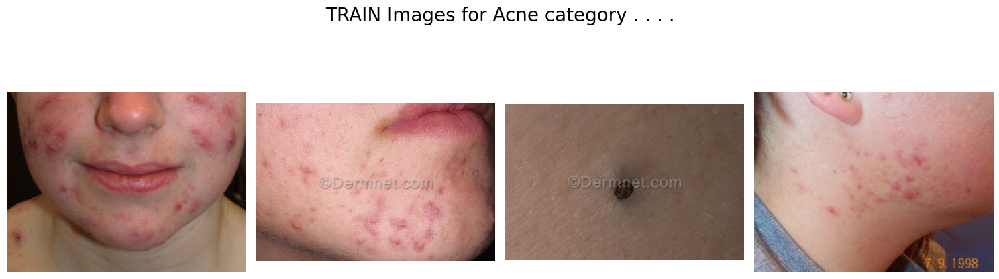

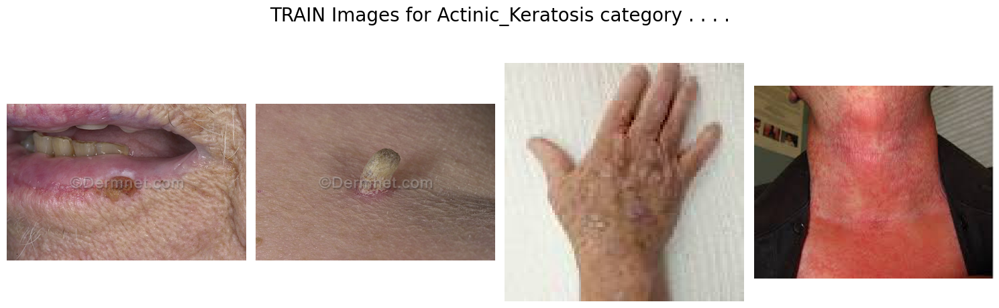

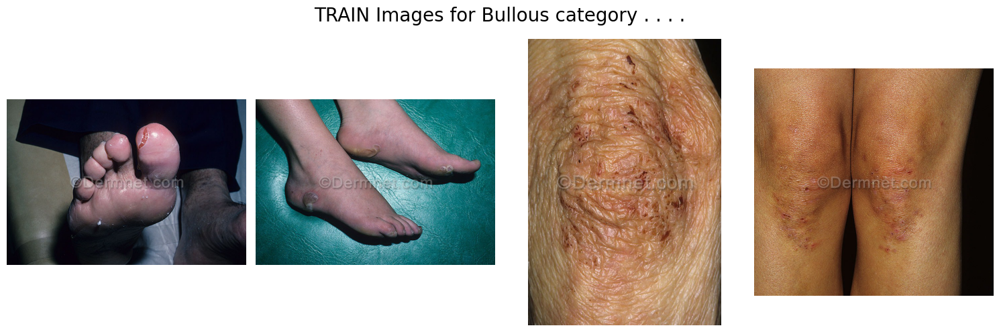

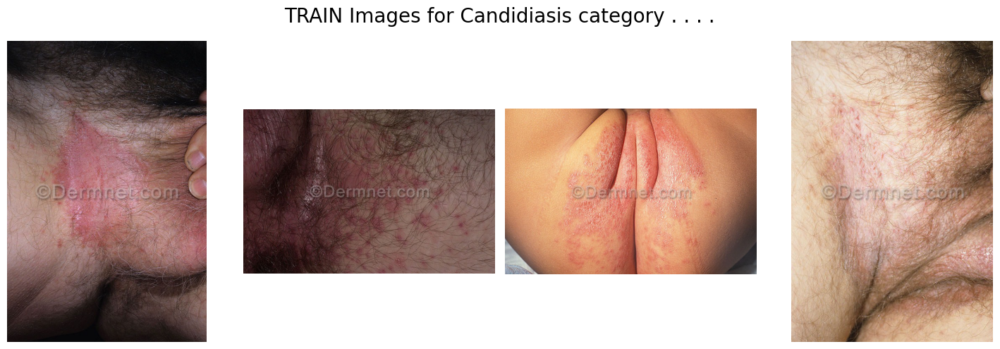

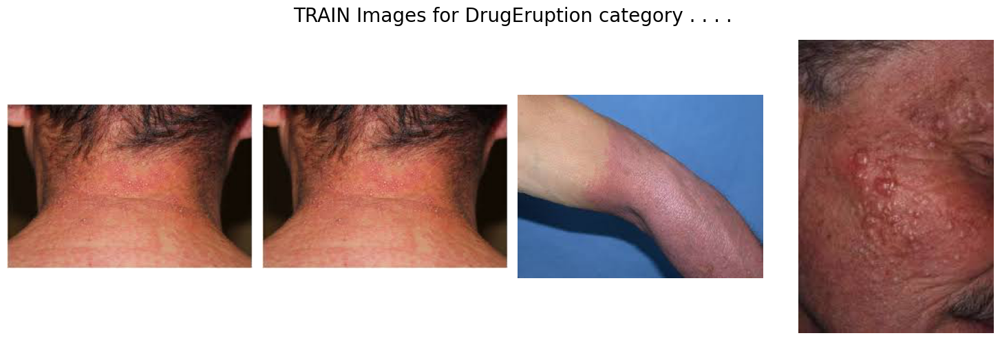

...

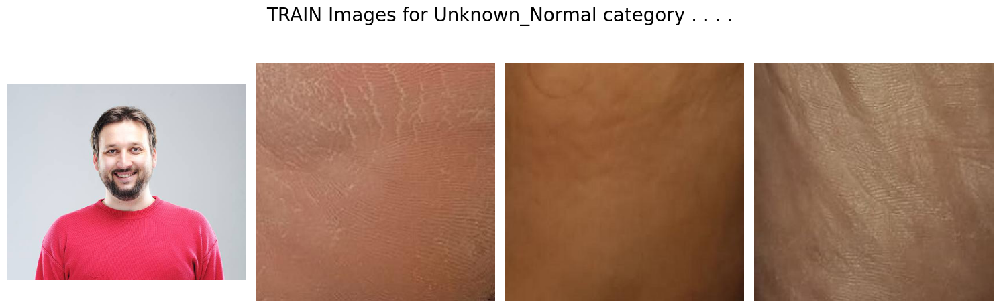

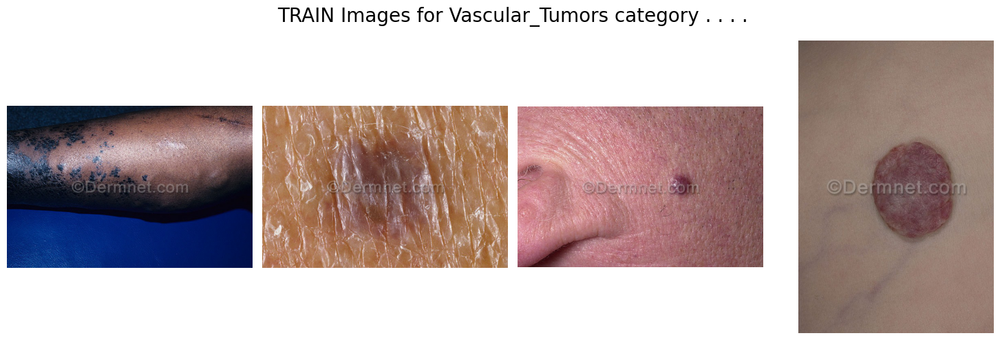

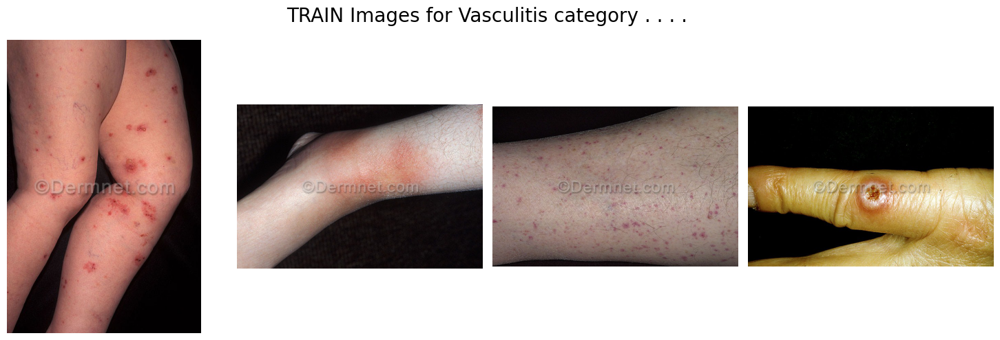

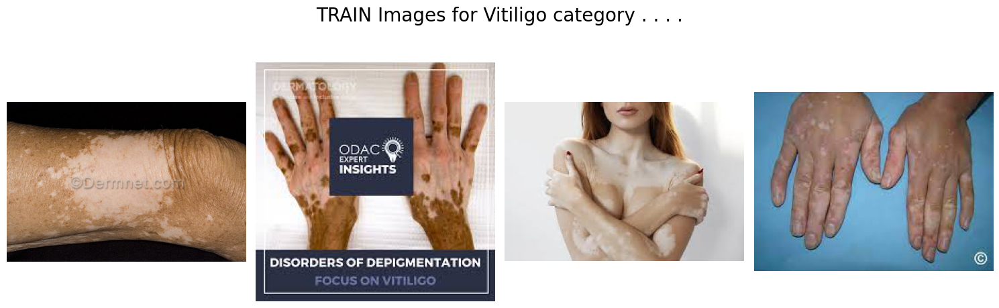

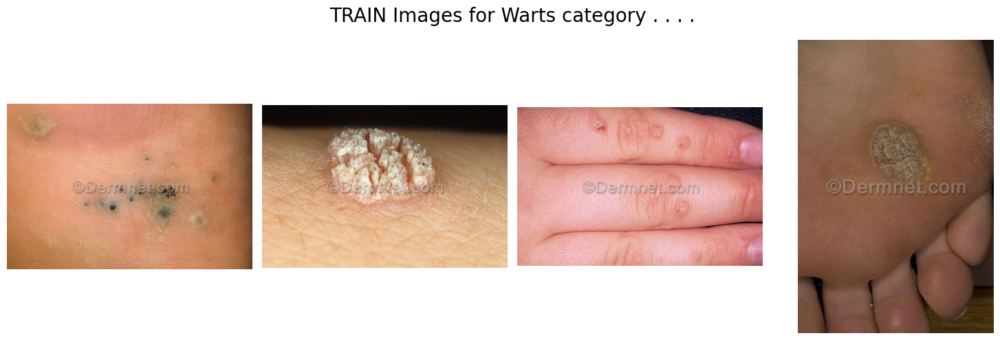

In [41]:
# Plot sample images for TRAIN dataset
print("=== TRAIN DATASET SAMPLES ===")
for cat in train_df['label'].unique():
    temp = train_df[train_df['label'] == cat]
    index_list = temp.index
    
    if len(index_list) >= 4:  # Only plot if we have at least 4 images
        fig, ax = plt.subplots(1, 4, figsize=(15, 5))
        fig.suptitle(f'TRAIN Images for {cat} category . . . .', fontsize=20)
        
        for i in range(4):
            index = np.random.randint(0, len(index_list))
            index = index_list[index]
            data = train_df.iloc[index]
            image_path = data['filepath']  # Use 'filepath' column name
            img = np.array(Image.open(image_path))
            ax[i].imshow(img)
            ax[i].axis('off')  # Remove axes for cleaner look
        
        plt.tight_layout()
        plt.show()
    else:
        print(f"Skipping {cat} - only has {len(index_list)} images")


### Preprocessing Function

In [42]:
def decode_image(filepath, label=None):

	# Read and process image
    img = tf.io.read_file(filepath)
    img = tf.image.decode_jpeg(img, channels=3)  # Ensure 3 channels (RGB)
    img = tf.image.resize(img, [224, 224])
    img = tf.cast(img, tf.float32) / 255.0
    
    # Handle different label formats
    if label is not None:
        # If label is already processed (one-hot or integer), return as is
        return img, label
    else:
        # If no label provided, return just the image
        return img


### One Hot Encode labels and Split into train/test filepaths and labels
- Pipelines for model efficiency

In [46]:
label_encoder = LabelEncoder()

# Fit unique labels for both the training and the test set 
all_labels = pd.concat([train_df['label'], test_df['label']]).unique()
label_encoder.fit(all_labels)

# Convert string labels to integers
train_labels_int = label_encoder.transform(train_df['label'])
test_labels_int = label_encoder.transform(test_df['label'])

TrainFiles = train_df['filepath']
TrainLabels = keras.utils.to_categorical(train_labels_int, num_classes=22)

TestFiles = test_df['filepath']
TestLabels = keras.utils.to_categorical(test_labels_int, num_classes=22)

### Create Dataset Using the TensorFlow Pipline


In [51]:
AUTO = tf.data.experimental.AUTOTUNE

train_ds = (
    tf.data.Dataset
    .from_tensor_slices((TrainFiles, TrainLabels))
    .map(decode_image, num_parallel_calls=AUTO)
    .batch(32)
    .prefetch(AUTO)
)

test_ds = (
    tf.data.Dataset
    .from_tensor_slices((TestFiles, TestLabels))
    .map(decode_image, num_parallel_calls=AUTO)
    .batch(32)
    .prefetch(AUTO)
)

### Model Utilising EfficientNets high performace Convolutional Neural Networks
- Initially using EfficientNetB0 for quickerSpeeds for my Neural Network

In [ ]:
base_model = EfficientNetB0(
    input_shape=(224,224,3),         # Height, Width and RGB
    weights='imagenet',
    include_top=False
)

inputs = layers.Input(shape=(224,224,3))
x = base_model(inputs)
x = layers.